# EDA for Spotify Dataset (Big Data Project 2022)

### First the data will be analysed regarding missing (NA) data and generelly processed

In [10]:
# Import libarys
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
data = pd.read_csv('tracks.csv')

# check if data is imported correclty
data.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [4]:
# check for missing (NA) data
data.isna().sum()

id                   0
name                71
popularity           0
duration_ms          0
explicit             0
artists              0
id_artists           0
release_date         0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
dtype: int64

In [5]:
# drop na values
data.dropna(inplace=True)

In [11]:
# quick overview report with pandas_profiling
profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True)

In [12]:
profile

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.40s/it]


In [13]:
# save report as html to view it in bigger window and faster in presentation
profile.to_file("Report_Features.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 16.98it/s]


array([[<AxesSubplot:title={'center':'popularity'}>,
        <AxesSubplot:title={'center':'duration_ms'}>,
        <AxesSubplot:title={'center':'explicit'}>,
        <AxesSubplot:title={'center':'danceability'}>],
       [<AxesSubplot:title={'center':'energy'}>,
        <AxesSubplot:title={'center':'key'}>,
        <AxesSubplot:title={'center':'loudness'}>,
        <AxesSubplot:title={'center':'mode'}>],
       [<AxesSubplot:title={'center':'speechiness'}>,
        <AxesSubplot:title={'center':'acousticness'}>,
        <AxesSubplot:title={'center':'instrumentalness'}>,
        <AxesSubplot:title={'center':'liveness'}>],
       [<AxesSubplot:title={'center':'valence'}>,
        <AxesSubplot:title={'center':'tempo'}>,
        <AxesSubplot:title={'center':'time_signature'}>, <AxesSubplot:>]],
      dtype=object)

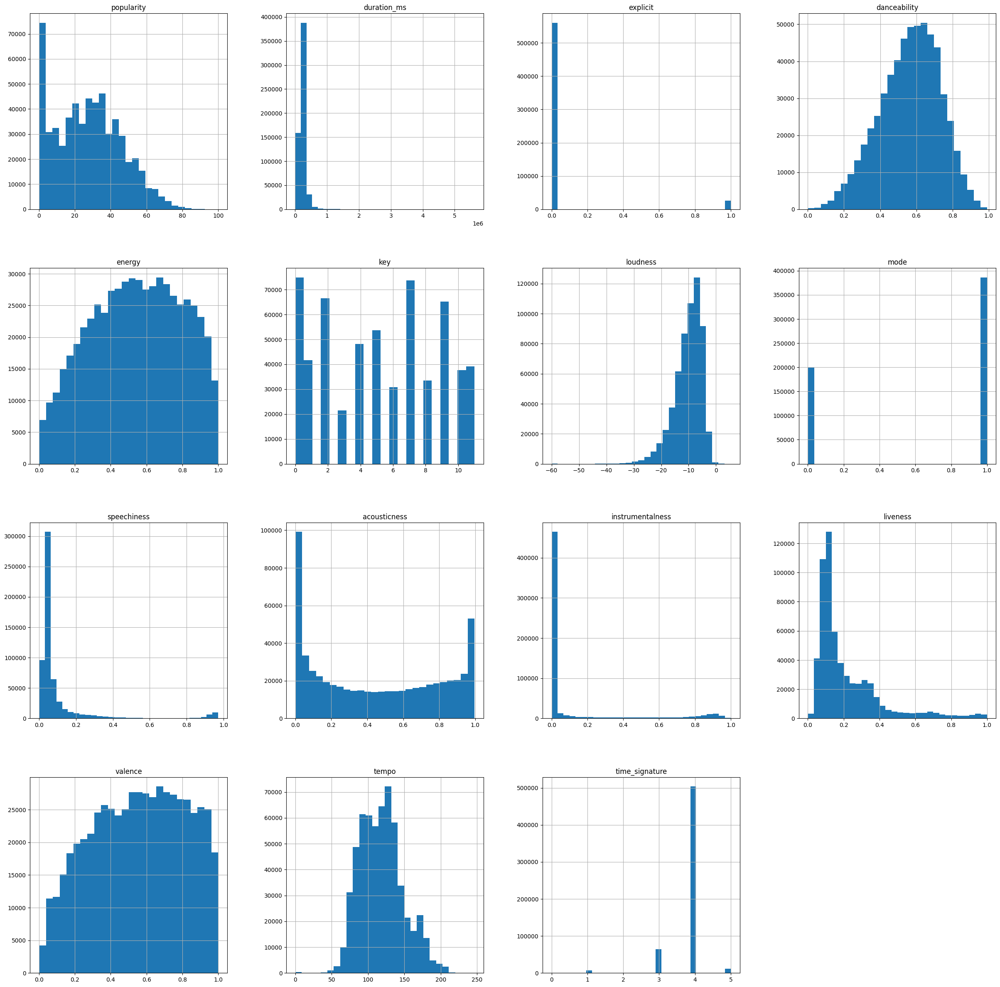

In [14]:
# first histogram to identify outlier and abnormalities
data.hist(figsize=(30, 30), bins='doane')

#### Following features shown abnormalties:
    -> Duplikates
    -> Most frequent artist is an author ("Die drei ???") of audiobooks, the reason is each chapter encouters as a track 
    -> duration_ms shows very short and very long songs
    -> popularity shows a lot of songs with popularity close to zero
    -> speechiness shows some tracks with high (>0.8) value, propably audiobooks/podcasts
    -> tempo shows values close to zero

### Remove duplicates:

In [16]:
print('Count before:', len(data))
data = data.drop_duplicates(subset=data.columns.difference(['id', 'popularity']))
print('Count after:', len(data))

Count before: 578485
Count after: 578485


### Analyse duration_ms:

In [17]:
data.sort_values(by='duration_ms',ascending=False).head(10)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
326329,3EEv9UCeZdn4MVFv8tsO1E,โครงสร้างแห่งสิ่งที่เรียกว่าชีวิต,3,5621218,0,['ท่านพุทธทาส'],['2ySk9zib3PuomvMGmCqdTA'],1979-07-28,0.638,0.537000,8,-13.365,1,0.7750,0.82500,0.00000,0.345,0.401,131.446,3
450241,7foc25ig7dibxvULPU2kBG,Brown Noise - 90 Minutes,50,5403500,0,['Sound Dreamer'],['4YJlpG8fCq38GnS8ElByiF'],2013-06-05,0.000,0.000099,2,-21.669,1,0.0000,0.11100,0.39200,0.137,0.000,0.000,0
131876,6rGikpwOv3LXaHWVCYbMNC,New Year's Eve 2015 Party Hits - Full DJ Party...,0,5042185,0,['Various Artists'],['0LyfQWJT6nXafLPZqxe9Of'],2014-12-19,0.457,0.891000,11,-4.596,0,0.0627,0.00467,0.00109,0.294,0.731,129.516,4
586457,7jTxNjSwPcPjSbK8829Vno,Surah Al-Araf,39,4995083,0,['Sheikh Mishary Rashid Alfasay'],['6nd2oiKSu9ksEAMzpXjIyi'],2010-01-01,0.426,0.249000,11,-7.202,1,0.0301,0.91000,0.00000,0.143,0.400,134.168,3
399471,7r86YmJo79FRcAHuVeKZp8,Tech House The Yearbook 2018 - Continuous Mix 2,0,4864333,0,['Monoteque'],['1w3ov1Em1iYnTpAh3pIbOf'],2018-12-16,0.691,0.639000,1,-10.181,1,0.0486,0.00424,0.72100,0.116,0.157,124.545,4
83501,28ci4OQnXnVyOJJjqNTza1,6 Years of 1980 Recordings - Part 2 - 2010-201...,0,4800118,0,['Dan McKie'],['5x6OZlUVGFX4F1QHJCgysn'],2013-01-28,0.751,0.807000,7,-7.129,1,0.0510,0.00257,0.51900,0.102,0.190,127.006,4
405153,3PmwiLyD0yPI63SsglmPN5,Surah An-Nisa,43,4797258,0,['Sheikh Mishary Rashid Alfasay'],['6nd2oiKSu9ksEAMzpXjIyi'],2010-01-01,0.408,0.258000,0,-8.920,1,0.0311,0.91600,0.00000,0.197,0.437,143.346,3
84493,3IG9msuvoyDjJlt2DL0ZIn,Monster Tunes Yearmix 2011 - Mixed by Mark Eteson,0,4792587,0,['Mark Eteson'],['6vwohTnFjRH2dQCZd32eSB'],2011-12-19,0.317,0.914000,11,-6.233,0,0.0489,0.00158,0.54600,0.129,0.108,137.075,4
86769,2nmbfiPT5diWNsfetpYAow,Digital Punk: Unleashed The 2013 Yearmix CD 1 ...,1,4786672,0,['Various Artists'],['0LyfQWJT6nXafLPZqxe9Of'],2013-12-15,0.468,0.947000,5,-4.575,0,0.1140,0.01280,0.00241,0.902,0.121,153.068,4
158668,6ZryuGcNCvBNTVt3cL76VN,Alltum Yearmix 2019 - mixed by John Clarcq,0,4775518,0,['John Clarcq'],['2BqsWXdFTpzzm1soINL0bC'],2019-12-20,0.488,0.847000,7,-7.627,1,0.0459,0.01660,0.71700,0.694,0.165,126.819,4


In [22]:
print("Longest track in dataset (in min):", round(data['duration_ms'].max()/60000, 2))
print("Shortest track in dataset (in sec.):", data['duration_ms'].min()/1000)

Longest track in dataset (in min): 93.69
shortest track in dataset (in sec.): 3.344


### -> It follows some of the tracks are actually playlists

In [26]:
# Removes all rows, in which the name of the track contrains "Mix" AND is longer than 20 min
data_cleaned_duration = data.loc[(~data['name'].str.contains('Mix')) & (data['duration_ms']<1200000)]
print('Dropped:', len(data)-len(data_cleaned_duration))


Dropped: 7651


In [27]:
# Pause Tracks (Pregap) are short tracks which were on old music CD, which are not part of the music itself 
data_cleaned_duration.sort_values(by='duration_ms',ascending=True).head(10)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
1441,2s6e7KLoQ5hie3Cnh73v2v,Pause Track,0,3344,0,['Louis Armstrong'],['19eLuQmk9aCobbVDHc6eek'],1925,0.0,0.000,0,-60.000,0,0.0,0.000000,0.000,0.0,0.0,0.0,0
1291,1JUFU8XJRWgG9Ir8KlLvpW,Pause Track,0,4000,0,['Louis Armstrong'],['19eLuQmk9aCobbVDHc6eek'],1925,0.0,0.000,0,-60.000,0,0.0,0.000000,0.000,0.0,0.0,0.0,0
351929,00TfxQ0wUMHrHoXQsyY1O4,The Shortest Message (2015),0,4937,1,"['Todd Glass', 'Blake Wexler']","['3aiC120kJreSUV17GecXwP', '19boQkDEIay9GaVAWk...",2018-01-12,0.0,0.642,7,-8.020,1,0.0,0.955000,0.000,0.0,0.0,0.0,0
23359,0hr9kRUi2X4MXc72A4VxG4,Pause Track,0,5108,0,['Sarah Vaughan'],['1bgyxtWjZwA5PQlDsvs9b8'],1949,0.0,0.000,0,-60.000,0,0.0,0.000000,0.000,0.0,0.0,0.0,0
12550,3IcXTeq9O2dpsSXsDj9naH,Pause Track - Live,0,5991,0,['Benny Goodman'],['1pBuKaLHJlIlqYxQQaflve'],1938,0.0,0.000,0,-60.000,0,0.0,0.000000,0.000,0.0,0.0,0.0,0
352696,3JPZ3f4LB9a1aw9HpDnVZ5,Kashmir - Live 2019,0,6360,0,['The Dark Tenor'],['2GIKcsT0xfsxpYUZ5yX2tL'],2019-10-11,0.0,0.772,2,-2.283,1,0.0,0.360000,0.836,0.0,0.0,0.0,0
12627,523qs4UcGlQ6ycdha1VGqs,Pause Track - Live,0,6362,0,['Benny Goodman'],['1pBuKaLHJlIlqYxQQaflve'],1938,0.0,0.000,0,-60.000,0,0.0,0.000000,0.000,0.0,0.0,0.0,0
352701,4A2ljLdaDYg6N4HXzxJhbn,Spectacle - Live 2019,0,6373,0,['The Dark Tenor'],['2GIKcsT0xfsxpYUZ5yX2tL'],2019-10-11,0.0,0.951,5,-1.957,1,0.0,0.000003,0.990,0.0,0.0,0.0,0
107044,3RNVzA6VcMkIii2Gn0vFq6,Hear It Grow,0,6373,0,['Underground Sound Of Lisbon'],['1KLufL4OUQFuzqaD3hSQ5u'],1998-02-26,0.0,0.327,1,-25.776,1,0.0,0.105000,0.000,0.0,0.0,0.0,0
107062,0eygsvCA2CLqAz3UMbFahW,Hear it grow,0,6373,0,['Underground Sound Of Lisbon'],['1KLufL4OUQFuzqaD3hSQ5u'],2006-06-13,0.0,0.327,1,-25.776,1,0.0,0.105000,0.000,0.0,0.0,0.0,0


In [31]:
# remove Pause Tracks
data_cleaned_duration_short = data_cleaned_duration.loc[~data_cleaned_duration['name'].str.contains('Pause Track')]
print('Dropped:', len(data_cleaned_duration)-len(data_cleaned_duration_short))  

Dropped: 5


### Analysing speechness to see if it's an audiobook/podcast

In [33]:
data_cleaned_duration_short.sort_values(by='speechiness',ascending=False).head(10)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
482422,1nbEqHuviTXtjbh4jei86V,"Wer die Nachtigall stört ..., Kapitel 98",6,274421,0,"['Harper Lee', 'Eva Mattes']","['3LckzrzeHnvOuErUOFlgyv', '5166OklcxPm89PCzel...",1960,0.606,0.182,10,-20.208,1,0.971,0.333,0.000000,0.4510,0.250,198.332,4
482360,4dpSno2rYwlcdEtTzJxUjR,"Wer die Nachtigall stört ..., Kapitel 6",8,277171,0,"['Harper Lee', 'Eva Mattes']","['3LckzrzeHnvOuErUOFlgyv', '5166OklcxPm89PCzel...",1960,0.624,0.199,3,-20.685,0,0.971,0.334,0.000000,0.1660,0.285,71.491,5
324123,4ucGpd15TTUybXsoS5mH9Q,"Wer die Nachtigall stört ..., Kapitel 1",12,361735,0,"['Harper Lee', 'Eva Mattes']","['3LckzrzeHnvOuErUOFlgyv', '5166OklcxPm89PCzel...",1960,0.603,0.214,1,-20.355,0,0.971,0.379,0.000000,0.5360,0.280,68.686,3
482444,1zBmrUrVCEA4a2MrzZWfiO,"Wer die Nachtigall stört ..., Kapitel 128",5,284343,0,"['Harper Lee', 'Eva Mattes']","['3LckzrzeHnvOuErUOFlgyv', '5166OklcxPm89PCzel...",1960,0.609,0.196,2,-20.836,1,0.970,0.217,0.000000,0.0727,0.287,69.527,4
482383,07LAmU1AOjDEAwemt8ZeFa,"Wer die Nachtigall stört ..., Kapitel 12",8,224159,0,"['Harper Lee', 'Eva Mattes']","['3LckzrzeHnvOuErUOFlgyv', '5166OklcxPm89PCzel...",1960,0.617,0.191,6,-20.494,1,0.970,0.285,0.000000,0.2980,0.353,186.083,4
25839,5c1iGqmxzXvDhiDYO1MU7Q,Kapitel 15 - Der alte Mann und das Meer - Erzä...,10,613240,0,"['Ernest Hemingway', 'Christian Brückner']","['4Oz2AHMbgEqf6w1sk41Z9w', '59N28aG3GjDHbmIrjD...",1952,0.606,0.310,11,-17.651,0,0.970,0.831,0.000007,0.5000,0.437,76.283,3
493349,7ckAD4hQuQXlXQD0Wf9kG6,"Wer die Nachtigall stört ..., Kapitel 105",5,280356,0,"['Harper Lee', 'Eva Mattes']","['3LckzrzeHnvOuErUOFlgyv', '5166OklcxPm89PCzel...",1960,0.620,0.189,3,-20.743,0,0.970,0.392,0.000000,0.5790,0.220,80.143,4
25842,5nnUR41x2t9KvRDKumNcKC,Kapitel 16 - Der alte Mann und das Meer - Erzä...,10,513600,0,"['Ernest Hemingway', 'Christian Brückner']","['4Oz2AHMbgEqf6w1sk41Z9w', '59N28aG3GjDHbmIrjD...",1952,0.595,0.305,11,-17.821,0,0.970,0.837,0.000017,0.2010,0.388,64.964,3
493342,00NWNAcHybqM8cky5RCyLj,"Wer die Nachtigall stört ..., Kapitel 95",6,214674,0,"['Harper Lee', 'Eva Mattes']","['3LckzrzeHnvOuErUOFlgyv', '5166OklcxPm89PCzel...",1960,0.632,0.169,3,-22.529,1,0.970,0.288,0.000000,0.3390,0.221,164.527,5
482472,4jepzbPQTIT1tkSWmtEKJa,"Wer die Nachtigall stört ..., Kapitel 147",5,288951,0,"['Harper Lee', 'Eva Mattes']","['3LckzrzeHnvOuErUOFlgyv', '5166OklcxPm89PCzel...",1960,0.629,0.134,3,-22.143,0,0.970,0.259,0.000000,0.3800,0.253,170.551,5


In [35]:
# Drop all tracks with speechiness <= 0.66 ( 0.66 is the recommended value from Spotify API for categorise as audiobook/podcast)
df_cleaned_spe = data_cleaned_duration_short.loc[data_cleaned_duration_short['speechiness']<=0.66]
print('Dropped:', len(data_cleaned_duration_short)-len(df_cleaned_spe))

Dropped: 22290


In [39]:
### Analyse outliers with tempo = 0, looks unrealistic that songs have 0 BPM
print(f"Tracks with higest tempo in dataset: {df_cleaned_spe['tempo'].max()}")
print(f"Tracks with lowest tempo in dataset: {df_cleaned_spe['tempo'].min()}")

Tracks with higest tempo in dataset: 246.381
Tracks with lowest tempo in dataset: 0.0


In [41]:
# Dropped all tracks with tempo = 0
df_cleaned_tempo = df_cleaned_spe.loc[(df_cleaned_spe['tempo']>0)]
print('Dropped:', len(df_cleaned_spe)-len(df_cleaned_tempo))

Dropped: 303


In [42]:
# Data error is confirmed, because after tempo 0 there are only songs with minimum tempo of 30.946
df_cleaned_tempo.sort_values(by='tempo',ascending=True).head(10)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
247347,49TODnGb6Y2wup2Unp2JWC,Since I Fell for You,22,173960,0,['Lenny Welch'],['4i9IEoaY6Q1v3Puqz3PwC1'],1965,0.422,0.1580,8,-12.790,1,0.0277,0.855,0.000000,0.1170,0.3080,30.946,4
280229,0fpjfdla9ZqTKZwDF8lLDh,Hannah's Soliloquy,0,93026,0,['Charlie Chaplin'],['6AmG7SNdlV9boPZ7dFVnLY'],1940,0.665,0.1200,2,-19.751,1,0.5640,0.925,0.000013,0.0773,0.3650,31.210,4
246191,5dm7kK3gV7HHJeJEtpFsWC,Ramunė pt.1,36,228641,0,['ba.'],['4JgXlDN8sCvwjFeFlWnsuf'],2019-05-13,0.142,0.0107,7,-17.153,0,0.0470,0.677,0.272000,0.1100,0.0667,31.262,3
23266,0SlZ9CijNCdWmKGaOeyRs0,"Die lustige Witwe: ""Es lebt eine Vilja"" (Vilja...",0,336227,0,"['Franz Lehár', 'Hilde Gueden', 'Vienna State ...","['3O3SOoPYtUSjajTdIag0nT', '6wC8AF31dHArqcz5j0...",1949,0.184,0.0967,7,-21.768,1,0.0527,0.973,0.000010,0.0761,0.1030,31.690,4
40164,7BHX4FX2hfw14gnvcQVJPO,"Love Theme (From ""Cinema Paradiso"")",39,197307,0,"['Ennio Morricone', 'Itzhak Perlman', 'John Wi...","['1nIUhcKHnK6iyumRyoV68C', '0hIG9FXgjQxT8fKaYc...",1966,0.189,0.1600,10,-19.862,1,0.0427,0.927,0.421000,0.1110,0.0749,31.988,4
433335,0LWafVIV4xvippou3djh8f,Cabeça Dinossauro - Vinheta,29,37067,0,['Titãs'],['2euX7vCVnJy3TVEGfc0RCl'],1997-09-22,0.449,0.1730,2,-28.181,1,0.0430,0.641,0.000921,0.8530,0.7900,32.205,3
193931,2ywdUBG9hzb0MaCzqzCVv5,Kapitel 22 - Die Schlossgespenster (Folge 008),35,63867,0,['Bibi Blocksberg'],['3t2iKODSDyzoDJw7AsD99u'],1983,0.583,0.3380,4,-13.592,0,0.5110,0.809,0.000000,0.9220,0.4090,32.332,4
219773,6SkxtHNrY1MCChEMaGq4qw,נגן עוגב,1,265667,0,['Yaffa Yarkoni'],['76pEKLfsS529BIAOR3xBKD'],1957-01-01,0.287,0.1390,9,-10.450,0,0.0444,0.941,0.000000,0.2970,0.2200,32.408,4
232455,09JLQzqNwrRmp5MGuPuUsM,"Theme From ""Ben Casey""",12,104067,0,['Nelson Riddle'],['6PyGlGbMoNqkofF14K4BWb'],1962-01-01,0.438,0.4840,0,-12.524,1,0.0301,0.341,0.066100,0.8290,0.9050,32.466,4
22386,2ulMTLTusvMTMpIL7S98Pa,Lithuanian Night- I. Moderato,0,137467,0,"['George Antheil', 'Del Sol String Quartet']","['00iJnnUu476m1HX16e3por', '5keTow3JGXZRACyDjl...",1948,0.285,0.0321,9,-26.741,0,0.0456,0.975,0.887000,0.1270,0.0337,32.631,4


In [86]:
# the realease_date is sometimes given as full date and sometimes just a year
# so we standardise this and using just the year

df_cleaned_tempo['year'] = df_cleaned_tempo['release_date'].str[:4]

/var/folders/mb/400sl00n4qn1qxkb8hmrpsbc0000gn/T/ipykernel_1586/2314433144.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned_tempo['year'] = df_cleaned_tempo['release_date'].str[:4]


In [43]:
print('Totals tracks in cleaned dataset:', len(df_cleaned_tempo))
print('Dropped tracks overall:', len(data)-len(df_cleaned_tempo))

Totals tracks in cleaned dataset: 548236
Dropped tracks overall: 30249


Summarize dataset:  75%|███████▌  | 24/32 [00:59<00:04,  1.65it/s, Calculate kendall correlation]/Users/fabiankochsiek/Documents/Big Data/Project/venv-big-data/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4868: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))
Export report to file: 100%|██████████| 1/1 [00:00<00:00, 27.52it/s]


array([[<AxesSubplot:title={'center':'popularity'}>,
        <AxesSubplot:title={'center':'duration_ms'}>,
        <AxesSubplot:title={'center':'explicit'}>,
        <AxesSubplot:title={'center':'danceability'}>],
       [<AxesSubplot:title={'center':'energy'}>,
        <AxesSubplot:title={'center':'key'}>,
        <AxesSubplot:title={'center':'loudness'}>,
        <AxesSubplot:title={'center':'mode'}>],
       [<AxesSubplot:title={'center':'speechiness'}>,
        <AxesSubplot:title={'center':'acousticness'}>,
        <AxesSubplot:title={'center':'instrumentalness'}>,
        <AxesSubplot:title={'center':'liveness'}>],
       [<AxesSubplot:title={'center':'valence'}>,
        <AxesSubplot:title={'center':'tempo'}>,
        <AxesSubplot:title={'center':'time_signature'}>, <AxesSubplot:>]],
      dtype=object)

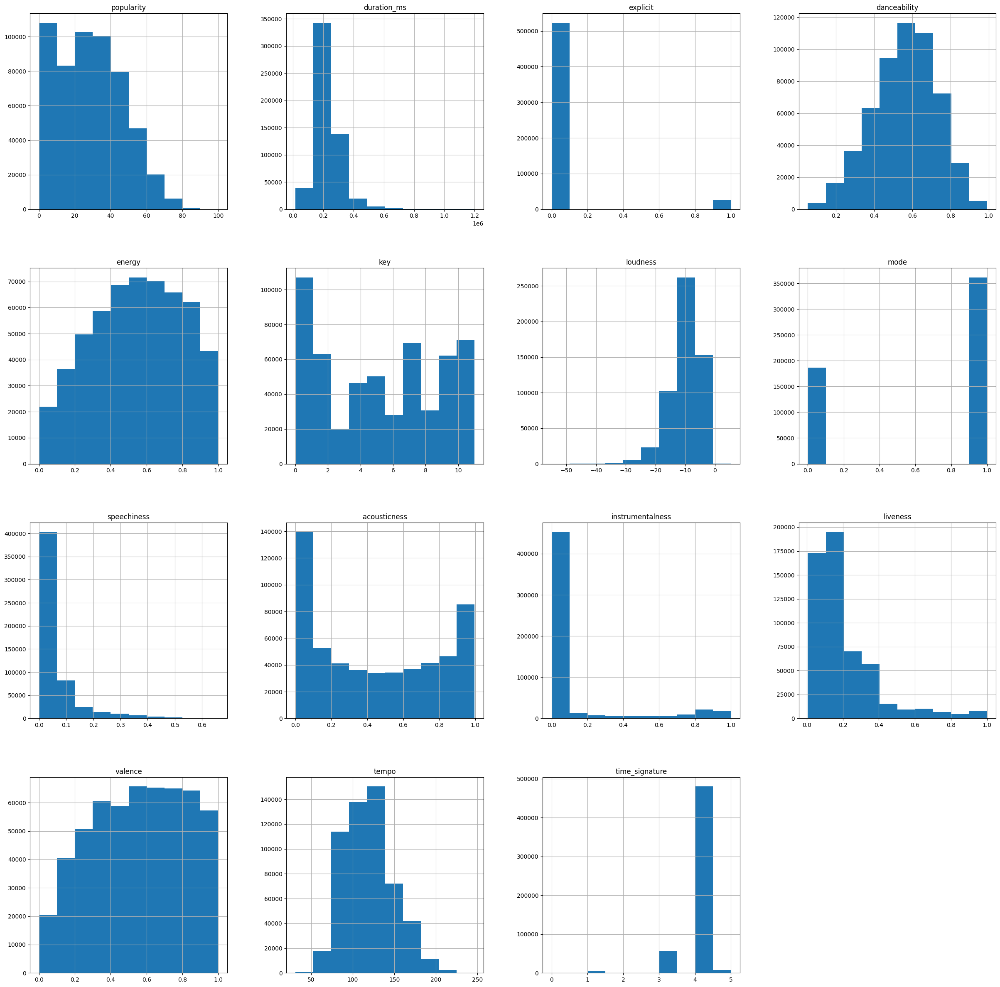

In [44]:
profile = ProfileReport(df_cleaned_tempo, title='Pandas Profiling Report after cleaning', explorative=True)
profile.to_file("Report_Features_after_cleaning.html")
df_cleaned_tempo.hist(figsize=(30, 30))

In [87]:
df_cleaned_tempo.to_csv('data_cleaned.csv', index=False)

# In the second Part the influence of the features to popularity will be analysed:

In [107]:
data = pd.read_csv('data_cleaned.csv')

In [89]:
data.sort_values(by='popularity',ascending=False).head(10)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,year
86746,4iJyoBOLtHqaGxP12qzhQI,Peaches (feat. Daniel Caesar & Giveon),100,198082,1,"['Justin Bieber', 'Daniel Caesar', 'Giveon']","['1uNFoZAHBGtllmzznpCI3s', '20wkVLutqVOYrc0kxF...",2021-03-19,0.677,0.696,...,-6.181,1,0.1190,0.32100,0.000000,0.4200,0.464,90.030,4,2021
86747,7lPN2DXiMsVn7XUKtOW1CS,drivers license,99,242014,1,['Olivia Rodrigo'],['1McMsnEElThX1knmY4oliG'],2021-01-08,0.585,0.436,...,-8.761,1,0.0601,0.72100,0.000013,0.1050,0.132,143.874,4,2021
86748,3Ofmpyhv5UAQ70mENzB277,Astronaut In The Ocean,98,132780,0,['Masked Wolf'],['1uU7g3DNSbsu0QjSEqZtEd'],2021-01-06,0.778,0.695,...,-6.865,0,0.0913,0.17500,0.000000,0.1500,0.472,149.996,4,2021
85915,6tDDoYIxWvMLTdKpjFkc1B,telepatía,97,160191,0,['Kali Uchis'],['1U1el3k54VvEUzo3ybLPlM'],2020-12-04,0.653,0.524,...,-9.016,0,0.0502,0.11200,0.000000,0.2030,0.553,83.970,4,2020
85914,5QO79kh1waicV47BqGRL3g,Save Your Tears,97,215627,1,['The Weeknd'],['1Xyo4u8uXC1ZmMpatF05PJ'],2020-03-20,0.680,0.826,...,-5.487,1,0.0309,0.02120,0.000012,0.5430,0.644,118.051,4,2020
85917,0VjIjW4GlUZAMYd2vXMi3b,Blinding Lights,96,200040,0,['The Weeknd'],['1Xyo4u8uXC1ZmMpatF05PJ'],2020-03-20,0.514,0.730,...,-5.934,1,0.0598,0.00146,0.000095,0.0897,0.334,171.005,4,2020
86749,7MAibcTli4IisCtbHKrGMh,Leave The Door Open,96,242096,0,"['Bruno Mars', 'Anderson .Paak', 'Silk Sonic']","['0du5cEVh5yTK9QJze8zA0C', '3jK9MiCrA42lLAdMGU...",2021-03-05,0.586,0.616,...,-7.964,1,0.0324,0.18200,0.000000,0.0927,0.719,148.088,4,2021
85918,6f3Slt0GbA2bPZlz0aIFXN,The Business,95,164000,0,['Tiësto'],['2o5jDhtHVPhrJdv3cEQ99Z'],2020-09-16,0.798,0.620,...,-7.079,0,0.2320,0.41400,0.019200,0.1120,0.235,120.031,4,2020
85083,60ynsPSSKe6O3sfwRnIBRf,Streets,94,226987,1,['Doja Cat'],['5cj0lLjcoR7YOSnhnX0Po5'],2019-11-07,0.749,0.463,...,-8.433,1,0.0828,0.20800,0.037100,0.3370,0.190,90.028,4,2019
85923,1xK1Gg9SxG8fy2Ya373oqb,Bandido,94,232853,0,"['Myke Towers', 'Juhn']","['7iK8PXO48WeuP03g8YR51W', '2LmcxBak1alK1bf7d1...",2020-12-10,0.713,0.617,...,-4.637,1,0.0887,0.12200,0.000000,0.0962,0.682,168.021,4,2020


In [90]:
# Correlation matrix is to big to get an insight, thats why a graphical representation is prefferd
data.corr()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,year
popularity,1.000000,0.059960,0.214215,0.205301,0.308321,0.016581,0.321657,-0.036456,0.060737,-0.384806,-0.235979,-0.042020,-0.004090,0.070281,0.090886,0.604122
duration_ms,0.059960,1.000000,-0.031211,-0.128114,0.045853,0.003445,-0.006652,-0.046535,-0.093635,-0.102888,0.069874,0.025703,-0.198495,-0.014115,0.034145,0.080666
explicit,0.214215,-0.031211,1.000000,0.158643,0.124098,0.011121,0.133873,-0.053234,0.307183,-0.151115,-0.069338,-0.006664,-0.017362,0.001327,0.044271,0.212253
danceability,0.205301,-0.128114,0.158643,1.000000,0.266542,0.019972,0.289999,-0.044677,0.196949,-0.260909,-0.218138,-0.130986,0.535287,-0.034791,0.170332,0.253865
energy,0.308321,0.045853,0.124098,0.266542,1.000000,0.034916,0.765251,-0.063250,0.114219,-0.721499,-0.230035,0.138420,0.389060,0.222049,0.191795,0.446634
key,0.016581,0.003445,0.011121,0.019972,0.034916,1.000000,0.024839,-0.122474,0.021436,-0.025994,-0.010265,-0.006673,0.021119,0.003302,0.006672,0.022271
loudness,0.321657,-0.006652,0.133873,0.289999,0.765251,0.024839,1.000000,-0.039965,0.064609,-0.523465,-0.374090,0.062669,0.284892,0.170307,0.144467,0.429904
mode,-0.036456,-0.046535,-0.053234,-0.044677,-0.063250,-0.122474,-0.039965,1.000000,-0.047684,0.055796,-0.007730,0.007994,0.012015,0.009531,-0.017861,-0.081839
speechiness,0.060737,-0.093635,0.307183,0.196949,0.114219,0.021436,0.064609,-0.047684,1.000000,-0.056871,-0.063662,0.102684,0.098695,0.033342,0.013523,0.077716
acousticness,-0.384806,-0.102888,-0.151115,-0.260909,-0.721499,-0.025994,-0.523465,0.055796,-0.056871,1.000000,0.236289,-0.026457,-0.189293,-0.185477,-0.181277,-0.528353


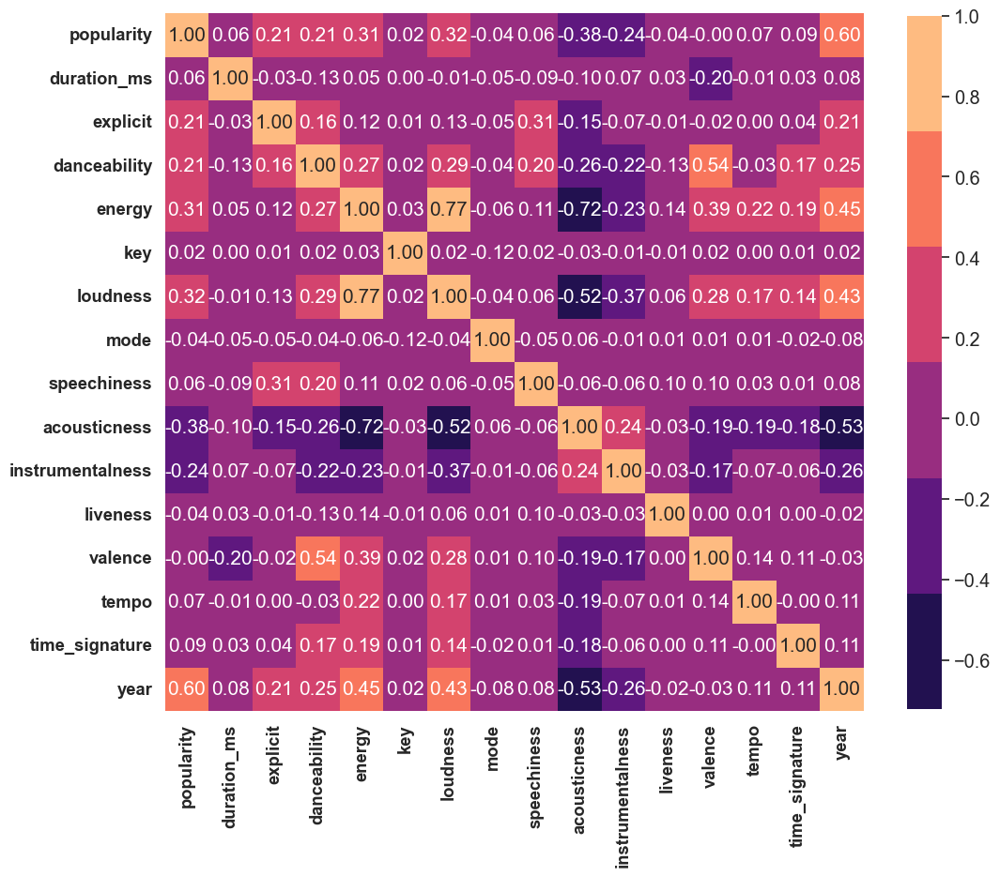

In [108]:
# Correlations 
corr = data.corr()
fig, ax = plt.subplots(figsize=(12, 12))
plt.rcParams.update({'font.weight': 300})
cmap = sns.color_palette("magma")
sns.set(font_scale=1.3) 
sns_plot=sns.heatmap(corr, cmap=cmap, square=True, annot=True, annot_kws={"size": 15},fmt='.2f', cbar=True, cbar_kws={"shrink": .80})
plt.show()

In [109]:
# Standardisierung der Daten zwischen 0-1 um vergleich in einem Plot zu ermöglichen
from sklearn import preprocessing

columns = ["acousticness","danceability","energy","explicit","instrumentalness","loudness", "year"]
x = data[columns].values 
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
data_scaled = pd.DataFrame(x_scaled,columns= columns)
data_scaled['popularity'] = data['popularity']

In [113]:
print(f"Songs with popularity > 85: {(data_scaled['popularity']>85).sum()}")

Songs with popularity > 85: 173


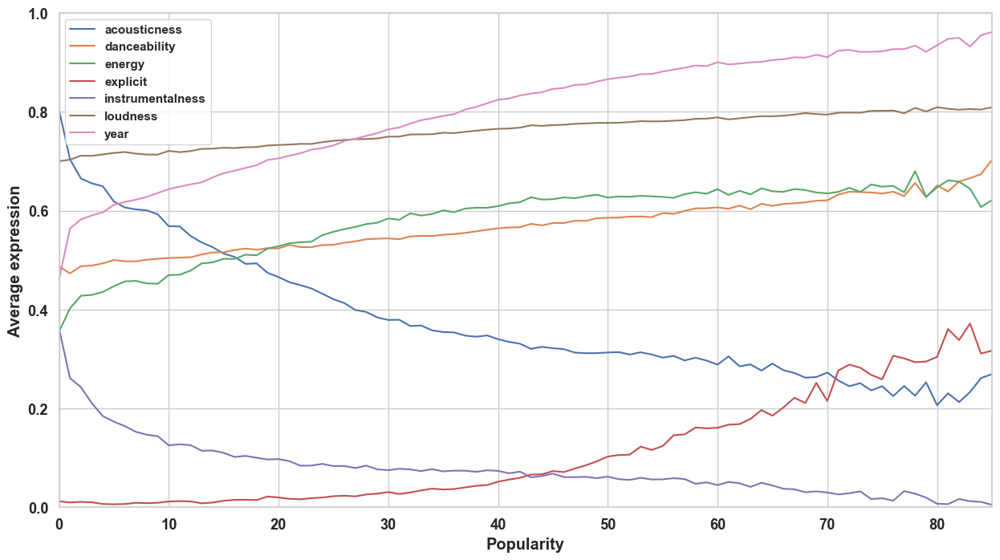

In [102]:
# plotting the graphs
fig, ax = plt.subplots(figsize=(15, 8))
plt.rcParams.update({'font.weight': 1000})
sns.set(style="whitegrid")
for col in columns:
    x = data_scaled.groupby("popularity")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col) #sizes="x-large"

ax.set_ylabel('Average expression',fontdict=dict(weight='bold'))
ax.set_xlabel('Popularity',fontdict=dict(weight='bold'))
ax.set_xlim(0,85)
ax.set_ylim(0,1)
ax.legend(loc="upper left") # bbox_to_anchor=(0.6,0.5)
sns.set(style="whitegrid", font_scale=1.2)
plt.savefig('features_popularity.pdf',bbox_inches='tight',transparent=True)

In [114]:
from sklearn import preprocessing
columns = ["acousticness","instrumentalness","explicit","loudness","popularity"]
x = data_scaled[columns].values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
data_scaled = pd.DataFrame(x_scaled,columns= columns)

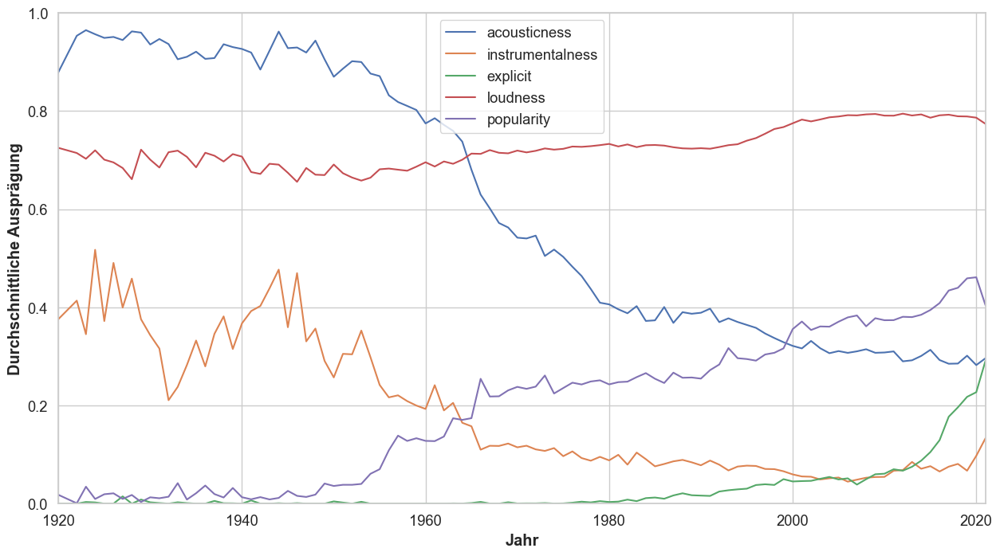

In [116]:
data_scaled['year'] = data['year']
fig, ax = plt.subplots(figsize=(15, 8))

for col in columns:
    x = data_scaled.groupby("year")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col)

ax.set_ylabel('Durchschnittliche Ausprägung',fontdict=dict(weight='bold'))
ax.set_xlabel('Jahr',fontdict=dict(weight='bold'))
ax.set_xlim(1920,2021)
ax.set_ylim(0,1)
ax.legend(loc="upper center")
sns.set(style="whitegrid", font_scale=1.2)
plt.savefig('features_year_neu.pdf',bbox_inches='tight',transparent=True)